# BERTopic Exercise Part 1

If you are working on Colab,
- The following cell installs all the packages you will need.
- You may want to make use of the (free) GPU resources: click on the down arrow in the upper-right of the page next to the RAM and Disk usage graphic.  Then "Change runtime type" and select "T4 GPU".  This will dramatically speed up your runtime for this code.
- Please be sure to save your file on your own account. (If you clicked on the link on our GitHub repo, your changes are not saved automatically).

If you are working locally on your computer, please see the [README.md](https://github.com/nuitrcs/AI_Week_Topic_Model/blob/main/README.md) file on our GitHub repo for a command to create a conda environment that has the necessary packages.

In [2]:
try:
    import google.colab
    print("You are working in Google Colab.  We will install necessary packages...")
    !pip install scikit-learn sentence-transformers umap-learn hdbscan bertopic pandas matplotlib datashader bokeh holoviews scikit-image colorcet keybert
except:
    print("You are not working in Google Colab.")
    print("Please be sure that the necessary packages are installed and available, ideally within a conda env (e.g., see here: https://github.com/nuitrcs/AI_Week_Topic_Model/blob/main/README.md).")


You are working in Google Colab.  We will install necessary packages...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.0/153.0 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 111.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.4/41.4 kB 3.6 MB/s eta 0:00:00


![graphical representation of topic modeling pipeline](https://github.com/nuitrcs/AI_Week_Topic_Modeling/blob/main/exercises/images/topic_modeling_pipeline.png?raw=1)

In this exercise, you will join one of four groups:
- Group 1: Embedding
- Group 2: Dimension reduction
- Group 3: Clustering
- Group 4: Labeling

Each group will focus on the parameters in their own section (e.g., Group 1 will focus on changing parameters for the Embedding step), but will also run the entire topic modeling pipeline from start to finish, leaving parameters for the other steps on their default values.

Each time you change a parameter in your section, please run the entire pipeline to see the resulting topics that are identified and labeled.  I have created a helpful function for you below to save you lines of code.

Save the results of each run (e.g. save the result dataframe to your computer as a csv, or take a screen grab) so that you can remember the differences and share those with us in your presentation.  Try to gain some intuition about how the parameters affect the results of the topic modeling pipeline.

Find the parameters that produce the best results for your step.  If you have extra time, feel free to explore other steps.  

### (All Groups) Read in the Preprocessed Data

For this demo, we will use the [`20newsgroups` dataset from scikit-learn](https://scikit-learn.org/stable/datasets/real_world.html#newsgroups-dataset).  We will fetch the data and then clean reformat it so that it is easier for BERTopic to work with.  I wrote code to do this in the `supplementary_code.ipynb` notebook; that code also saves the output to a .csv file.  We can simply read in the resulting cleaned data below.  

In [3]:
import pandas as pd
# The line below will read the file directly from GitHub and will work on Colab.
df = pd.read_csv('https://raw.githubusercontent.com/nuitrcs/AI_Week_Topic_Modeling/refs/heads/main/exercises/data/sklearn_20newsgroups_cleaned.csv')
# If you're working on your local computer and prefer to simply read the file from your disk, you can instead use the line below.
# df = pd.read_csv('exercises/data/sklearn_20newsgroups_cleaned.csv')
df.head()

,original_text,cleaned_text,labels,labels_text
0,\nCONGRAULATIONS !!!! Your helmet just passed ...,CONGRAULATIONS !!!! Your helmet just passed th...,2,rec.motorcycles
1,SP> From: paulson@tab00.larc.nasa.gov (Sharon ...,SP> From: paulson@tab00.larc.nasa.gov (Sharon ...,6,sci.med
2,"Dear Binary Newsers,\n\nI am looking for Quick...","Dear Binary Newsers,\n\nI am looking for Quick...",0,comp.graphics
3,"Thanks to aldridge@netcom.com, I now know a bi...","Thanks to aldridge@netcom.com, I now know a bi...",6,sci.med
4,Are there significant differences between V2.0...,Are there significant differences between V2.0...,0,comp.graphics


In [4]:
# store the texts into docs variable as a list for use in BERTopic
docs = df["cleaned_text"].values.tolist()
print(docs[:5])

['CONGRAULATIONS !!!! Your helmet just passed the Snell Test.\n \n\nOh well, as least it looks ok now. Still, it may not save your head as well\nas before you dropped it.\n\nMike', "SP> From: paulson@tab00.larc.nasa.gov (Sharon Paulson)\nSP> to describe here.  I have a fourteen year old daugter who experienced\nSP> a seizure on November 3, 1992 at 6:45AM after eating Kellog's Frosted\nSP> Flakes.\n\nSP> Well, we were going along fine and the other morning, April 5, she had\nSP> a bowl of another Kellog's frosted kind of cereal, Fruit Loops (I am\n\nSP> When I mentioned what she ate the first time as a possible reason for\nSP> the seizure the neurologist basically negated that as an idea.  Now\nSP> after this second episode, so similar in nature to the first, even\nSP> he is scratching his head.\n\nThere's no data that sugar-coated cereals cause seizures.  I haven't\neven seen anything anecdotal on it.  Given how common they are eaten\n- do you know any child or adolescent who *doesn't*

### (All Groups) Default Model Definition

The cell below defines default parameters and packages for each step of topic modeling. You can refer back to this as a reference when you start modifying your specific step below.  Everyone should run this cell.

In [5]:
from bertopic import BERTopic

from sentence_transformers import SentenceTransformer
from umap import UMAP
import umap.plot
from hdbscan import HDBSCAN
from bertopic.representation import KeyBERTInspired

/usr/local/lib/python3.12/dist-packages/hdbscan/plots.py:448: SyntaxWarning: invalid escape sequence '\l'
  axis.set_ylabel('$\lambda$ value')
/usr/local/lib/python3.12/dist-packages/hdbscan/robust_single_linkage_.py:175: SyntaxWarning: invalid escape sequence '\{'
  $max \{ core_k(a), core_k(b), 1/\alpha d(a,b) \}$.
/usr/local/lib/python3.12/dist-packages/numba/np/ufunc/dufunc.py:343: NumbaWarning: Compilation requested for previously compiled argument types ((uint32,)). This has no effect and perhaps indicates a bug in the calling code (compiling a ufunc more than once for the same signature
  warnings.warn(msg, errors.NumbaWarning)
/usr/local/lib/python3.12/dist-packages/numba/np/ufunc/dufunc.py:343: NumbaWarning: Compilation requested for previously compiled argument types ((uint32,)). This has no effect and perhaps indicates a bug in the calling code (compiling a ufunc more than once for the same signature
  warnings.warn(msg, errors.NumbaWarning)
/usr/local/lib/python3.12/dist-pa

In [6]:

# define default models and parameters
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")
dimension_reduction_model = UMAP(n_components=2, n_neighbors = 15, metric="cosine", random_state=42)
clustering_model = HDBSCAN(min_cluster_size=12, min_samples=5, cluster_selection_epsilon=0.2)
representation_model = KeyBERTInspired()

# we will also run these models here so that you can have everything ready to go below
# these steps aren't strictly necessary if you want to run everything directly through BERTopic but will help with this exercise
embeddings = embedding_model.encode(docs) # encode the texts into embeddings
dimension_reduction_model.fit(embeddings) # fit the UMAP model on the embeddings
clustering_model.fit(dimension_reduction_model.embedding_) # fit the clustering model on the UMAP output

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

HDBSCAN(cluster_selection_epsilon=0.2, min_cluster_size=12, min_samples=5)

Once you customize the step in the pipeline that corresponds to your group, you should run the full topic model through the `BERTopic()` function shown below. I will create a wrapper function for you to reduce the number of lines you need to copy.  

In [8]:
def runBERTopic(
    embedding_model=embedding_model,
    dimension_reduction_model=dimension_reduction_model,
    clustering_model=clustering_model,
    representation_model=representation_model
):

    # define topic model pipeline with BERTopic
    topic_model = BERTopic(
        embedding_model=embedding_model,
        umap_model=dimension_reduction_model,
        hdbscan_model=clustering_model,
        representation_model=representation_model
    )

    # begin topic modeling using the processed documents
    topic_model.fit(docs)

    return topic_model

In [9]:
topic_model = runBERTopic() # using the defaults we defined above

### (All Groups) Visualize and Observe the Output of BERTopic

Before you dive in to your specific group's section, please familiarize yourself with these methods to visualize and explore your results.  BERTopic model comes with a set of methods that you can use to observe the output of your pipeline.
For more options, you can explore different chapters in the BERTopic documentation.

- [Visualize topics](https://maartengr.github.io/BERTopic/getting_started/visualization/visualize_topics.html)
- [Visualize documents](https://maartengr.github.io/BERTopic/getting_started/visualization/visualize_documents.html)
- [Additional info on best practices](https://maartengr.github.io/BERTopic/getting_started/best_practices/best_practices.html)

We provide some examples below. Try running these for yourself and see what you get! You can use these methods to understand how your choices of model & parameters can affect the output.

In [10]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,256,-1_cview_image_does_no,"[cview, image, does, no, use, file, sgi, all, ...",[The following are my thoughts on a meeting th...
1,0,966,0_and_get_more_if,"[and, get, more, if, than, but, for, has, also...","[[Please, note the Newsgroups.]\n\nRecent disc..."
2,1,959,1_they_new_them_for,"[they, new, them, for, in, re, this, had, no, ...",[I need some advice on having someone ride pil...
3,2,570,2_station_also_list_is,"[station, also, list, is, been, there, if, was...",[Archive-name: space/probe\nLast-modified: $Da...
4,3,480,3_they_their_because_geb,"[they, their, because, geb, msg, cause, these,...","[As promised, below is a personal critique of ..."
5,4,449,4_puck_flyers_nhl_rangers,"[puck, flyers, nhl, rangers, hockey, players, ...","[Apparently, Part 2 (defensemen numbered 2 thr..."
6,5,448,5_had_have_some_sox,"[had, have, some, sox, were, on, baseball, the...",[So far Simmons looks like a total idiot.\n\n\...
7,6,150,6_discovered_stuff_why_in,"[discovered, stuff, why, in, book, are, here, ...","[: : 42 is 101010 binary, and who would forget..."
8,7,118,7_not_hockey_playoffs_know,"[not, hockey, playoffs, know, have, has, get, ...","[Yes, a point well-taken ... however, even in ..."
9,8,36,8_had_all_pasteur_other,"[had, all, pasteur, other, what, there, from, ...",[Avoiding mistakes is certainly highly desirab...


In [11]:
topic_model.visualize_topics()

In [12]:
# Run the visualization with the original embeddings
topic_model.visualize_documents(docs, embeddings=embeddings)

## Group 1: Embeddings

![graphical representation of embedding step](https://github.com/nuitrcs/AI_Week_Topic_Modeling/blob/main/exercises/images/embeddings.png?raw=1)

[Sentence transformer (also called SBERT)](https://sbert.net/index.html) is a widely used python package for accessing embedding models. You can find a selection of available models that can be used with SBERT [on this page of SBERT documentation](https://sbert.net/docs/sentence_transformer/pretrained_models.html#original-models). These models have been evaluated for their ability to produce high quality sentence embeddings. Choose a pretrained model for yourself and see how it affects the output.  Also read the BERTopic documentation [here](https://maartengr.github.io/BERTopic/getting_started/embeddings/embeddings.html).

In [ ]:
# initialize model
# all-MiniLM-L6-v2 is name of the pretrained model we used above (you should change this model)
# after you try this model, you should try others from the documentaiton linked above
new_embedding_model = SentenceTransformer("all-MiniLM-L6-v2")
new_embeddings = new_embedding_model.encode(docs) # encode the texts into embeddings

print("Dimension of embeddings: ",new_embeddings.shape)
print(new_embeddings)

Once you select a pretrained embedding model, run the topic modeling pipeline using the embedding model of your choice by copying the `BERTopic()` command provided above into the cell below and running it.  And don't forget to explore and visualize your results (e.g., using the example code from above)!

In [ ]:
# run the model
new_topic_model = runBERTopic(embedding_model=new_embedding_model) # using rest of the defaults we defined above

In [ ]:
# copy code from above (or write your own) to explore and visualize the output
# for example ...
new_topic_model.visualize_documents(docs, embeddings=embeddings)

## Group 2: Dimension Reduction

![graphical representation of dimension reduction step](https://github.com/nuitrcs/AI_Week_Topic_Modeling/blob/main/exercises/images/dimension_reduction.png?raw=1)

The output of the embedding model is a high dimensional array.  Attempting to cluster on those data would likely be difficult because the data points are sparse. We can perform dimension reduction to reduce the embeddings to 2 dimensions, which should preserve the useful information, and make the clustering step easier.

[UMAP](https://umap-learn.readthedocs.io/en/latest/basic_usage.html) is a popular method for dimensionality reduction
often used in text analysis.
It works by preserving both local and global structures of the data in a lower-dimensional space.
Several parameters control UMAP’s behavior and output:

- `n_neighbors`: Controls the balance between **local** and **global** structure.
    - Lower values focus more on local structure, emphasizing relationships between nearby points, but may miss the global context.
    - Higher values capture broader structures and global patterns, but may smooth out local details.
- `n_components`: Specifies the target number of dimensions in the reduced space. This is typically set to 2 or 3.
- `metric`: Defines the distance metric used to compute similarity between points. For text embeddings, `"cosine"` distance is commonly used.
- `random_state`: Sets the seed for reproducibility.
    Since UMAP involves stochastic processes (e.g., initialization and optimization), fixing the random_state ensures consistent results across runs.

The cell below is a code for running UMAP on the embeddings calculated from the previous step. (Recall that we already define the `embedding_model` above.) Try out different parameters and plot the result until you find a reasonable configuration that groups the embeddings in a reasonable manner.

For more detailed explanation of the parameters with examples, consult [this page](https://umap-learn.readthedocs.io/en/latest/parameters.html).  Also read the BERTopic documentation [here](https://maartengr.github.io/BERTopic/getting_started/dim_reduction/dim_reduction.html).

In [29]:
# initialize UMAP model
# try changing the parameters one at a time
new_dimension_reduction_model = UMAP(
    n_components=3,
    n_neighbors=15,
    metric="cosine",
    min_dist = 0.1,
    random_state=54382
)

# fit the UMAP model to find the best 2D representation of the embeddings
new_dimension_reduction_model.fit(embeddings)

UMAP(angular_rp_forest=True, metric='cosine', n_components=3, n_jobs=1, random_state=54382, tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True})

Once you fit the dimension reduction model, you can check the dimension reduction output with the following code. When you decide on the set of parameters, try running entire BERTopic model with your chosen dimension reduction model and see what you get!

In [14]:
# Plot the UMAP representation
umap.plot.points(new_dimension_reduction_model)

TypeError: points() got an unexpected keyword argument 'n_compoments'

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import umap
%matplotlib inline

In [27]:
def draw_umap(n_neighbors=15, min_dist=0.1, n_components=3, metric='euclidean', title=''):
    fit = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=n_components,
        metric=metric
    )
    u = fit.fit_transform(embeddings);

    fig = plt.figure()
    if n_components == 1:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], range(len(u)), c=embeddings)
    if n_components == 2:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], u[:,1], c=embeddings)
    if n_components == 3:
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(u[:,0], u[:,1], u[:,2], c=embeddings, s=100)
    plt.title(title, fontsize=18)

ValueError: 'c' argument has 1768704 elements, which is inconsistent with 'x' and 'y' with size 4606.

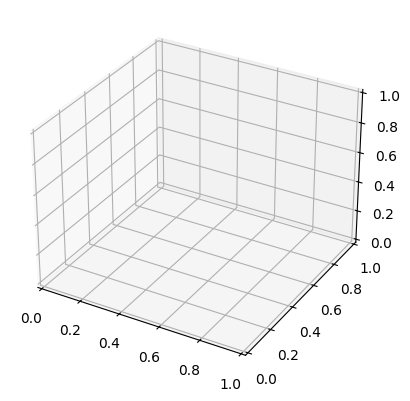

In [28]:
draw_umap(n_components=3, title='n_components = 3')

Once you select the parameters for your UMAP model, run the topic modeling pipeline using your UMAP model by copying the `BERTopic()` command provided above into the cell below and running it.  And don't forget to explore and visualize your results (e.g., using the example code from above)!

In [30]:
# run the model
new_topic_model = runBERTopic(dimension_reduction_model=new_dimension_reduction_model) # using rest of the defaults we defined above

In [31]:
# copy code from above (or write your own) to explore and visualize the output
# for example ...
new_topic_model.visualize_documents(docs, embeddings=embeddings)

## Group 3:  Clustering

![graphical representation of clustering step](https://github.com/nuitrcs/AI_Week_Topic_Modeling/blob/main/exercises/images/clustering.png?raw=1)

This group assumes that you have already selected embedding and dimension reduction methods and need to cluster our 2-D representation of the data. [HDBSCAN](https://hdbscan.readthedocs.io/en/latest/index.html) is a popular method that used an unsupervised machine learning algorithm.  

HDBSCAN provides many parameters that you can use to control the clustering behavior. You can read about the parameters in-depth [here](https://hdbscan.readthedocs.io/en/latest/parameter_selection.html). Important parameters in HDBSCAN that you will most commonly interact with are the following:

- `min_cluster_size`: Specifies the smallest size grouping to be considered as a cluster. Increasing this value results in a smaller number of clusters.
- `min_samples`: Provides a measure of how conservative you want your clustering to be. The larger the value, the more conservative the clustering, and therefore more points will be declared as noise, and clustering is restricted to more densely populated areas.
- `cluster_selection_epsilon`: Helps with merging micro-clusters in regions where they are abundant, and ensures that clusters given below the threshold are not split further.

Remember that we already defined the embeddings and reduced dimension output of those embeddings above.

Your job is to modify the code below to cluster the way you think is the best. Try playing with different parameters. If you aren't able to get the output that you would like, try a different [clustering algorithm](https://scikit-learn.org/stable/modules/clustering.html). While HDBSCAN certain provides many advantages, you are not limited to only relying on that algorithm, and for a particular dataset other algorithm may perform better. Also, read the BERTopic documentation [here](https://maartengr.github.io/BERTopic/getting_started/clustering/clustering.html).

In [ ]:
# initialize HDBSCAN model
# try changing the parameters one at a time
new_clustering_model = HDBSCAN(
    min_cluster_size=15,
    min_samples=1,
    cluster_selection_epsilon=0.165
)

# fit the clustering model to the reduced embeddings calculated in the previous step
new_clustering_model.fit(dimension_reduction_model.embedding_)

Once you train the clustering model and label the datapoints, you can visually check the result using the `umap.plot` function.

In [ ]:
umap.plot.points(dimension_reduction_model, labels=new_clustering_model.labels_, theme="blue")

Once you select the parameters for your HDBSCAN model, run the topic modeling pipeline using your HDBSCAN model by copying the `BERTopic()` command provided above into the cell below and running it.  And don't forget to explore and visualize your results (e.g., using the example code from above)!

In [ ]:
# run the model
new_topic_model = runBERTopic(clustering_model=new_clustering_model) # using rest of the defaults we defined above

In [ ]:
# copy code from above (or write your own) to explore and visualize the output
# for example ...
new_topic_model.visualize_documents(docs, embeddings=embeddings)

### Group 4: Labeling

![graphical representation of labeling step](https://github.com/nuitrcs/AI_Week_Topic_Modeling/blob/main/exercises/images/labeling.png?raw=1)

In this group, you will control how each cluster is labeled. The default BERTopic method uses a form of TF-IDF, but this doesn't always return optimal topic labels. We can improve by using a representation model implemented by BERTopic. The example below will demonstrate how to use a model inspired by KeyBERT, available in the BERTopic package, but you are free to try different methods as well.

Recall that we already defined the default embedding, dimension reduction and clustering steps above.

First, try running BERTopic without specifying a representation model. What kind of result do you get? Is this what we want? How can this be fixed? BERTopic explains how you can make better representations [here](https://maartengr.github.io/BERTopic/getting_started/best_practices/best_practices.html#improving-default-representation) and [here](https://maartengr.github.io/BERTopic/getting_started/representation/representation.html). Try different approaches for yourself! You are not limited to what's provided in the BERTopic package, however. As we saw in the demo, you can utilize models outside of BERTopic to try to extract topics and keywords.

In [ ]:
new_topic_model = runBERTopic(representation_model=None) # using rest of the defaults we defined above
new_topic_model.get_topic_info()

In [ ]:
# copy code from above (or write your own) to explore and visualize the output
# for example ...
new_topic_model.visualize_documents(docs, embeddings=embeddings)

Now let's compare with the `KeyBERTInspired` representation we found using all the defaults (above).  Afterwards, you can try a different representation model from the links provided above.

In [ ]:
new_representation_model = #fill this in with a model that is discussed in the links provided above

new2_topic_model = runBERTopic(representation_model=new_representation_model) # using rest of the defaults we defined above

Don't forget to explore and visualize your results (e.g., using the example code from above)!

In [ ]:
# copy code from above to explore and visualize the results
# for example ...
new2_topic_model.visualize_documents(docs, embeddings=embeddings)

In [32]:
# imports
import pandas as pd
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from umap import UMAP
from hdbscan import HDBSCAN
from bertopic.representation import KeyBERTInspired

In [35]:

reviews = pd.read_csv("https://raw.githubusercontent.com/nuitrcs/AI_Week_Topic_Modeling/refs/heads/main/exercises/data/bali_hotel_reviews.csv")
# read in the data and select the column of interest
#reviews = pd.read_csv("../data/bali_hotel_reviews.csv")
print(reviews.columns)
print(len(reviews))
docs = reviews['Review'].to_list()
print(docs[:5])


Index(['Location', 'Hotel', 'UserID', 'Title', 'Review', 'Rating', 'Value',
       'Accessibility', 'Service', 'Room', 'Cleanliness', 'Sleep Quality'],
      dtype='object')
5798
['Check in was smooth although my room wasn’t ready at 5pm, I was due to arrive at 4pm First night I was in a room overlooking JL Legian which is a very busy load st, I asked if I could be moved the 2nd night and they were very helpful and moved to a great room overlooking 1 of the pools. Overall the staff here are very friendly and helpful, rooms are comfortable. Breakfast buffet is good with plenty to choose from. Water pressure is bad so It’s a little frustrating getting a good shower. Great location but be aware there is a lot of traffic noise. I’d still happily stay here again', 'We thoroughly enjoyed our stay at Mercure Legian, with a fantastic room with huge wrap around balcony overlooking the mountains, also enjoying the magnificent sunrise and sunset from the balcony. Special thanks to the Resident Ma

In [60]:
from bertopic import BERTopic
from sklearn.decomposition import PCA



In [62]:

# define default models and parameters
embedding_model = SentenceTransformer("all-mpnet-base-v2")
dimension_reduction_model = UMAP(n_components=2, n_neighbors = 15, metric="cosine", random_state=42)
#dimension_reduction_model = PCA(n_components=2)
clustering_model = HDBSCAN(min_cluster_size=12, min_samples=5, cluster_selection_epsilon=0.2)
representation_model = KeyBERTInspired()

# we will also run these models here so that you can have everything ready to go below
# these steps aren't strictly necessary if you want to run everything directly through BERTopic but will help with this exercise
embeddings = embedding_model.encode(docs) # encode the texts into embeddings
dimension_reduction_model.fit(embeddings) # fit the UMAP model on the embeddings
clustering_model.fit(dimension_reduction_model.embedding_) # fit the clustering model on the UMAP output

AttributeError: 'PCA' object has no attribute 'embedding_'

In [149]:
import openai
from bertopic.representation import KeyBERTInspired, MaximalMarginalRelevance, OpenAI, PartOfSpeech

# KeyBERT
keybert_model = KeyBERTInspired()

# Part-of-Speech
pos_model = PartOfSpeech("en_core_web_sm")

# MMR
mmr_model = MaximalMarginalRelevance(diversity=0.3)

# GPT-3.5
client = openai.OpenAI(api_key="sk-...")
prompt = """
I have a topic that contains the following documents:
[DOCUMENTS]
The topic is described by the following keywords: [KEYWORDS]

Based on the information above, extract a short but highly descriptive topic label of at most 5 words. Make sure it is in the following format:
topic: <topic label>
"""
openai_model = OpenAI(client, model="gpt-4o-mini", exponential_backoff=True, prompt=prompt)

# All representation models
representation_model = {
    "KeyBERT": keybert_model,
    "OpenAI": openai_model,  # Uncomment if you will use OpenAI
    "MMR": mmr_model,
    "POS": pos_model
}

In [164]:

# define default models and parameters
embedding_model = SentenceTransformer("all-mpnet-base-v2")
dimension_reduction_model = UMAP(n_components=2, n_neighbors = 15, metric="cosine", random_state=42)

#dimension_reduction_model = PCA(n_components=2)
clustering_model = HDBSCAN(min_cluster_size=5, min_samples=5, cluster_selection_epsilon=0.2)
#representation_model = KeyBERTInspired()

representation_model = mmr_model
# we will also run these models here so that you can have everything ready to go below
# these steps aren't strictly necessary if you want to run everything directly through BERTopic but will help with this exercise
#embeddings = embedding_model.encode(docs) # encode the texts into embeddings
#dimension_reduction_model.fit(embeddings) # fit the UMAP model on the embeddings
#clustering_model.fit(dimension_reduction_model) # fit the clustering model on the UMAP output

In [42]:

# define default models and parameters


In [165]:

def runBERTopic(
    embedding_model=embedding_model,
    dimension_reduction_model=dimension_reduction_model,
    clustering_model=clustering_model,
    representation_model=representation_model
):

    # define topic model pipeline with BERTopic
    topic_model = BERTopic(
        embedding_model=embedding_model,
        umap_model=dimension_reduction_model,
        hdbscan_model=clustering_model,
        representation_model=representation_model
    )

    # begin topic modeling using the processed documents
    topic_model.fit(docs)

    return topic_model

In [166]:

topic_model = runBERTopic()

In [167]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,25,-1_it_friendly_bali_room,"[it, friendly, bali, room, star, place, atanay...",[We stay here for 4 nights from 16th to 20th M...
1,0,2937,0_and_to_is_hotel,"[and, to, is, hotel, pool, staff, were, breakf...",[Stayed in this hotel on Dec19 for 7 nights. A...
2,1,854,1_bali_to_in_hotel,"[bali, to, in, hotel, with, it, room, pool, st...",[I stayed here for two nights and loved it. Th...
3,2,403,2_anvaya_and_to_resort,"[anvaya, and, to, resort, beach, staff, were, ...",[We had another fantastic stay at the beautifu...
4,3,213,3_candidasa_rama_and_is,"[candidasa, rama, and, is, resort, were, resta...",[We stayed a week at Rama Candidasa for our ho...
5,4,194,4_mercure_legian_bali_were,"[mercure, legian, bali, were, hotel, with, sta...",[We usually stay in Kuta but this time we deci...
6,5,181,5_mercure_legian_staff_room,"[mercure, legian, staff, room, stay, hotel, we...",[We stayed for 6 nights and it was great! All ...
7,6,127,6_stones_we_pool_was,"[stones, we, pool, was, hotel, in, location, b...","[The stones hotel in Legian was great, when we..."
8,7,119,7_sanur_maya_beach_was,"[sanur, maya, beach, was, pool, resort, our, l...",[Maya sanur is a beautiful property on the bea...
9,8,99,8_atanaya_bali_hotel_to,"[atanaya, bali, hotel, to, rooftop, stay, kris...",[I had very good experience during my trip to ...


In [168]:
topic_model.visualize_topics()

In [169]:
# Run the visualization with the original embeddings
topic_model.visualize_documents(docs, embeddings=embeddings)

In [87]:
from bertopic import BERTopic
from sklearn.cluster import KMeans

#cluster_model = KMeans(n_clusters=50)
# define default models and parameters
embedding_model = SentenceTransformer("all-mpnet-base-v2")
#dimension_reduction_model = UMAP(n_components=2, n_neighbors = 15, metric="cosine", random_state=42)

dimension_reduction_model = PCA(n_components=2)
#clustering_model = HDBSCAN(min_cluster_size=12, min_samples=5, cluster_selection_epsilon=0.2)
clustering_model = KMeans(n_clusters = 5)
representation_model = KeyBERTInspired()


In [88]:
def runBERTopic(
    embedding_model=embedding_model,
    dimension_reduction_model=dimension_reduction_model,
    clustering_model=clustering_model,
    representation_model=representation_model
):

    # define topic model pipeline with BERTopic
    topic_model = BERTopic(
        embedding_model=embedding_model,
        umap_model=dimension_reduction_model,
        hdbscan_model=clustering_model,
        representation_model=representation_model
    )

    # begin topic modeling using the processed documents
    topic_model.fit(docs)

    return topic_model

In [89]:
topic_model = runBERTopic()

In [90]:
topic_model.visualize_topics()

In [91]:
# Run the visualization with the original embeddings
topic_model.visualize_documents(docs, embeddings=embeddings)